## What is an Imbalanced Dataset?

An imbalanced dataset occurs when one class contains significantly more samples than another class.

In [1]:
# Example:

# Class	     Count
# No Fraud	 99,000
# Fraud	     1,000

# Class distribution: 99% : 1% , This is called class imbalance.

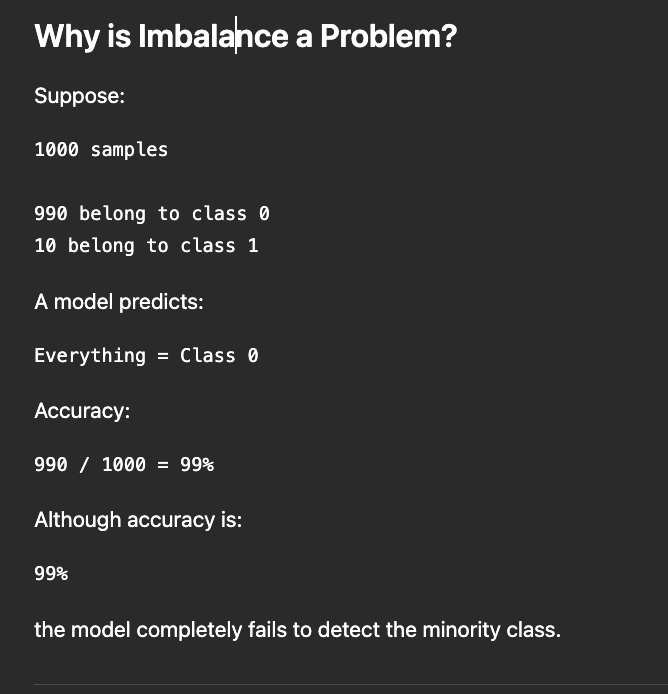

In [60]:
# Evaluation Metrics for Imbalanced Data

# Avoid using:

# Accuracy

# Use:

# Precision
# Recall
# F1 Score
# ROC-AUC
# PR-AUC
# Balanced Accuracy

# Example:

# from sklearn.metrics import classification_report

# print(
#     classification_report(
#         y_test,
#         y_pred
#     )
# )

## Techniques to handle imbalance datasets:

1-cost sensitive learning

2-Random Oversampling

3-Random Undersampling

4-SMOTE

5-Borderline SMOTE

6-SVMSMOTE

7-ADASYN

8-SMOTE+ Tomek Links

9- SMOTE + ENN Links

10- Tomek Links

11- NearMiss

12- Ensemble Methods

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df=pd.read_csv('/Users/priyanshugupta/Desktop/scikit learn/Datasets/creditcard.csv')
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [40]:
df['Class'].value_counts() ## Imbalanced dataset

Class
0    284315
1       492
Name: count, dtype: int64

<Axes: xlabel='Class'>

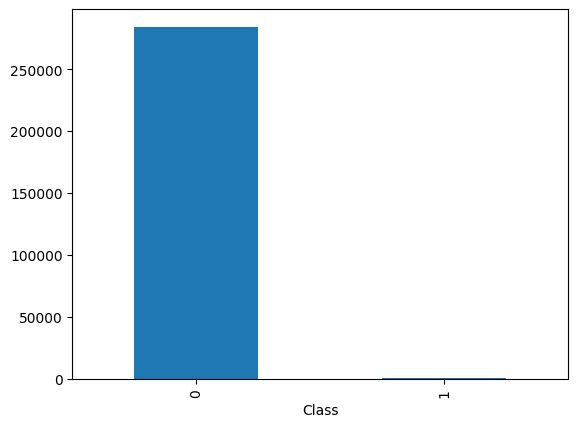

In [41]:
df['Class'].value_counts().plot(kind='bar')

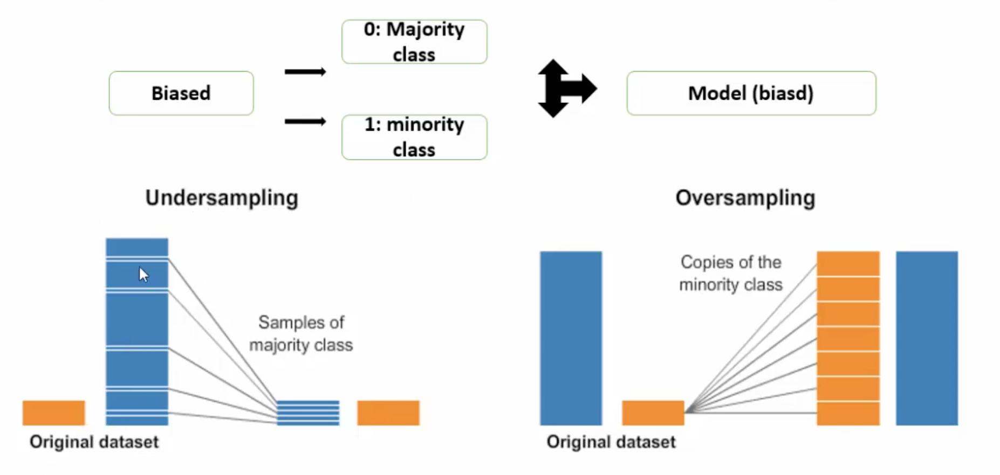

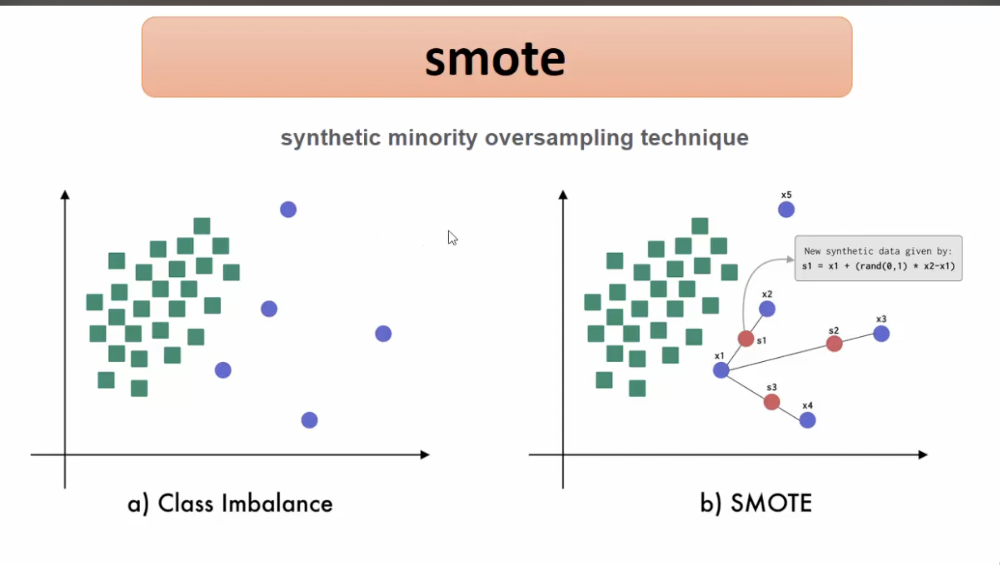

In [42]:
df.shape

(284807, 31)

In [43]:
df=df.sample(20000)
df['Class'].value_counts()

Class
0    19975
1       25
Name: count, dtype: int64

## Training model on imbalanced dataset

In [44]:
from sklearn.model_selection import train_test_split
X=df.drop('Class',axis=1)
y=df['Class']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=20)


In [45]:
y_train.value_counts()

Class
0    15983
1       17
Name: count, dtype: int64

In [46]:
from sklearn.ensemble import RandomForestClassifier
rf_model=RandomForestClassifier()
rf_model.fit(X_train,y_train)

## prediction
y_pred=rf_model.predict(X_test)

## cal confusion matrix

from sklearn.metrics import confusion_matrix,classification_report

conf_matrix=confusion_matrix(y_test,y_pred)
print('confusion matrix:')
print(conf_matrix)

print('classification_report')
class_report=classification_report(y_test,y_pred)
print(class_report)


## calculate accuracy 
accuracy=rf_model.score(X_test,y_test)
print('accuracy:',accuracy)

confusion matrix:
[[3992    0]
 [   3    5]]
classification_report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.62      0.77         8

    accuracy                           1.00      4000
   macro avg       1.00      0.81      0.88      4000
weighted avg       1.00      1.00      1.00      4000

accuracy: 0.99925


## Applying sampling techniques


## RandomOverSampler

Duplicate minority samples.

In [47]:
# Before:

# Class 0 = 9500
# Class 1 = 500

# After:

# Class 0 = 9500
# Class 1 = 9500

In [48]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,confusion_matrix
from collections import Counter
## initalize RandomOverSampler
ros=RandomOverSampler()

## we perform resampling techniques only on the training data not on the testing data

X_ros,y_ros=ros.fit_resample(X_train,y_train) ## from fitting it learns about the classes and its distribution
print(Counter(y_ros))

Counter({0: 15983, 1: 15983})


In [49]:
## Initalize the model
rf_model_ros=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_ros.fit(X_ros,y_ros)

## predict on test set 

y_pred_ros=rf_model_ros.predict(X_test)

## confusion matrix

conf_matrix_ros=confusion_matrix(y_test,y_pred_ros)
print('confusion matrix(Random Oversampling):')
print(conf_matrix_ros)

## classification report

class_report_ros=classification_report(y_test,y_pred_ros)
print('classification report (Random Oversampling):')
print(class_report_ros)

## cal accuracy

accuracy_ros=rf_model_ros.score(X_test,y_pred_ros)
print('Accuracy (Random Oversampling):',accuracy_ros)

confusion matrix(Random Oversampling):
[[3992    0]
 [   6    2]]
classification report (Random Oversampling):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.25      0.40         8

    accuracy                           1.00      4000
   macro avg       1.00      0.62      0.70      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (Random Oversampling): 1.0


## Advantages:

Simple.

Preserves all minority information.

## Disadvantages 

Overfitting due to duplicated rows.

## Random Undersampling(RandomUnderSampler)

In [50]:
# Remove majority samples.

# Before:

# 9500 : 500

# After:

# 500 : 500

## Advantages

Faster training.

Smaller dataset.

## Disadvantages

Loss of information.

In [51]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,confusion_matrix

## initalize RandomUnderSampler
rus=RandomUnderSampler()

## perform Random Undersampling
X_rus,y_rus=rus.fit_resample(X_train,y_train)

y_rus.value_counts()

Class
0    17
1    17
Name: count, dtype: int64

In [52]:
## Initalize the model
rf_model_rus=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_rus.fit(X_rus,y_rus)

## predict on test set 

y_pred_rus=rf_model_rus.predict(X_test)

## confusion matrix

conf_matrix_rus=confusion_matrix(y_test,y_pred_rus)
print('confusion matrix(Random Undersampling):')
print(conf_matrix_rus)

## classification report

class_report_rus=classification_report(y_test,y_pred_rus)
print('classification report (Random Undersampling):')
print(class_report_rus)

## cal accuracy

accuracy_rus=rf_model_rus.score(X_test,y_pred_rus)
print('Accuracy (Random Oversampling):',accuracy_rus)

confusion matrix(Random Undersampling):
[[3814  178]
 [   1    7]]
classification report (Random Undersampling):
              precision    recall  f1-score   support

           0       1.00      0.96      0.98      3992
           1       0.04      0.88      0.07         8

    accuracy                           0.96      4000
   macro avg       0.52      0.92      0.52      4000
weighted avg       1.00      0.96      0.98      4000

Accuracy (Random Oversampling): 1.0


## Smote is similar to RandomOversampler 

Difference is it doesn't just produce exact duplicate data like randomoversampler it creates augmented data instad(synthetic data)

Creates new synthetic samples instead of duplicating rows.

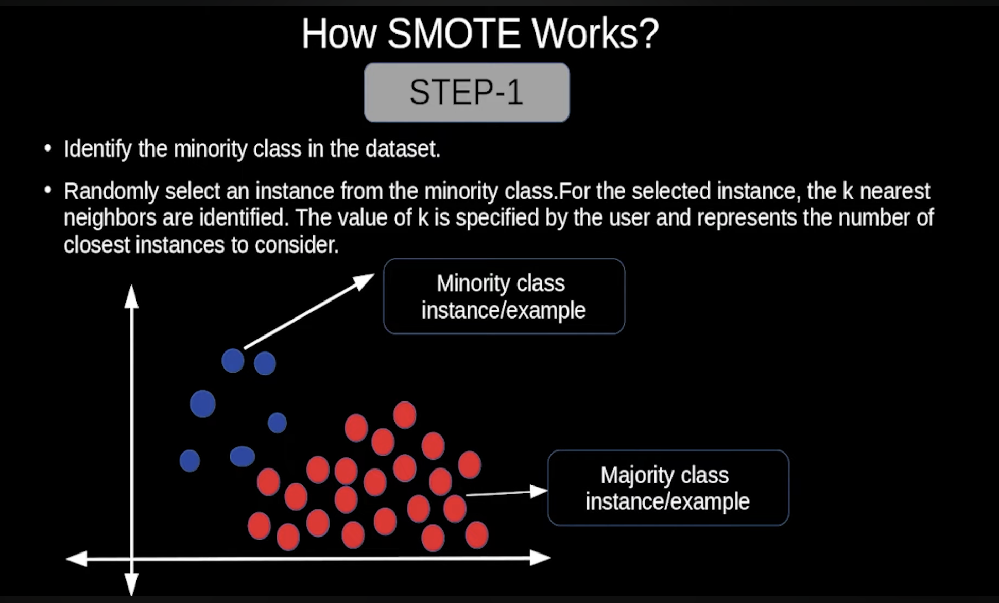

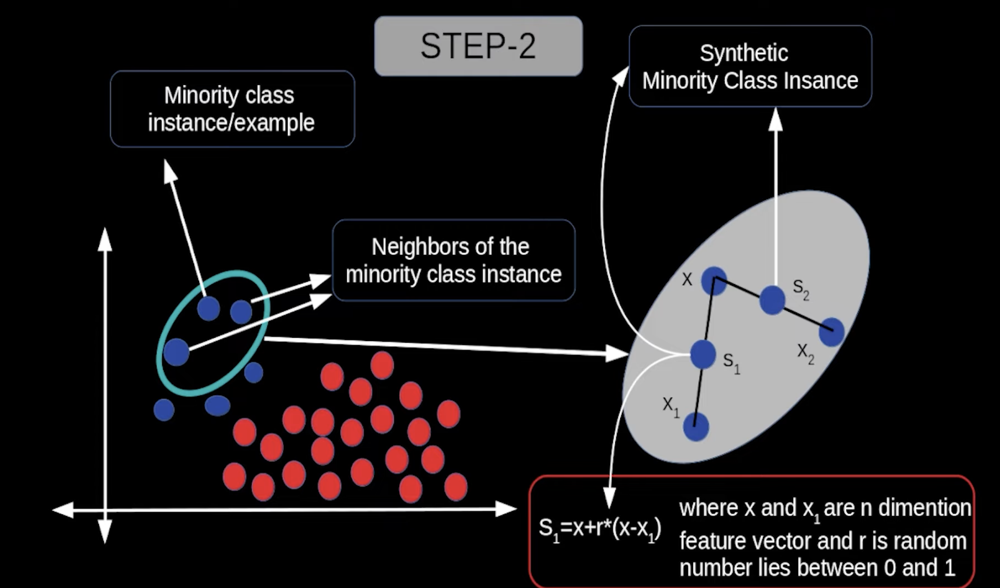

In [53]:
# Internal Idea

# Suppose:

# Minority samples

# (1,2)
# (2,3)

# SMOTE creates:

# (1.4,2.3)
# (1.8,2.7)

In [54]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier


## Initalize SMOTE
smote=SMOTE()

## PERFORM SMOTE

X_smote,y_smote=smote.fit_resample(X_train,y_train)

y_smote.value_counts()

Class
0    15983
1    15983
Name: count, dtype: int64

In [55]:
## Initalize the model
rf_model_smote=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_smote.fit(X_smote,y_smote)

## predict on test set 

y_pred_smote=rf_model_smote.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_smote)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_smote)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_smote)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   6    2]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.25      0.40         8

    accuracy                           1.00      4000
   macro avg       1.00      0.62      0.70      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.95425


In [56]:
# Important Parameters
# SMOTE(
#     sampling_strategy='auto',
#     k_neighbors=5
# )


# Advantages:
# Reduces overfitting.
# Better than random oversampling.

# Disadvantages
# Creates unrealistic samples occasionally.

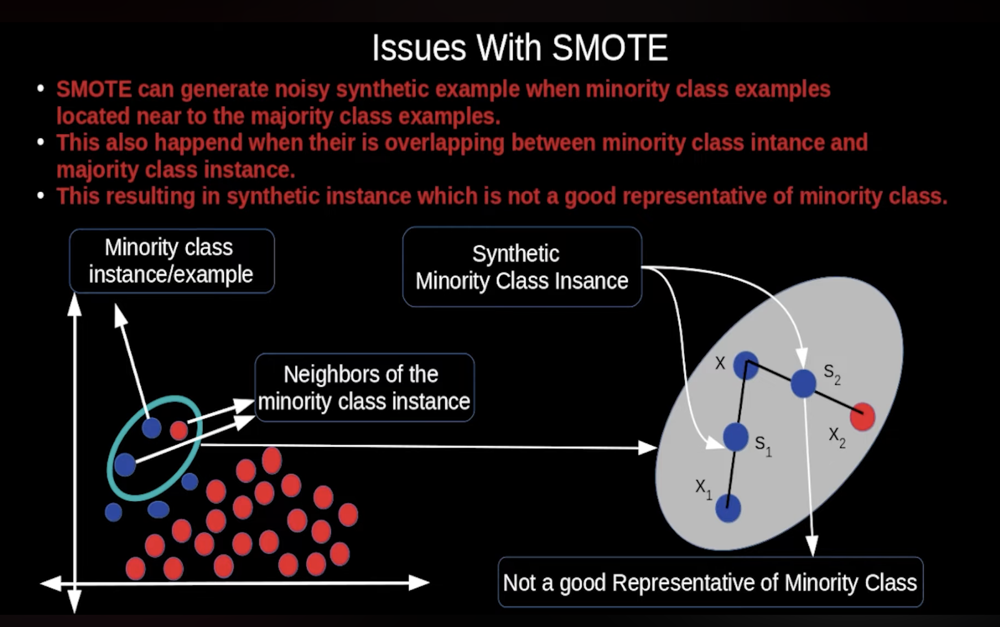

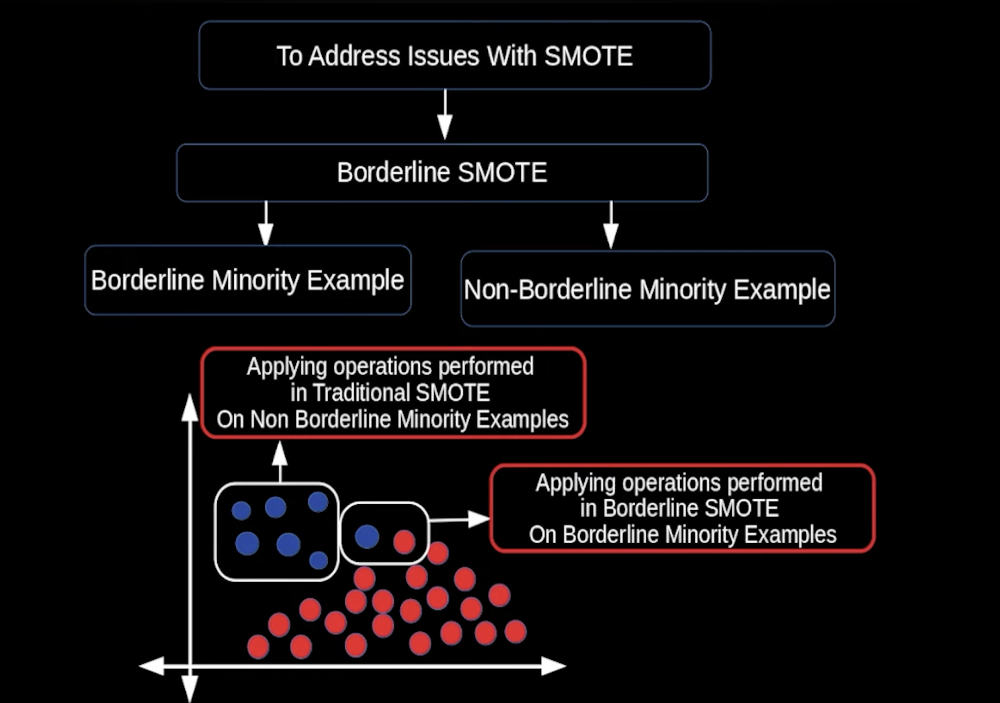

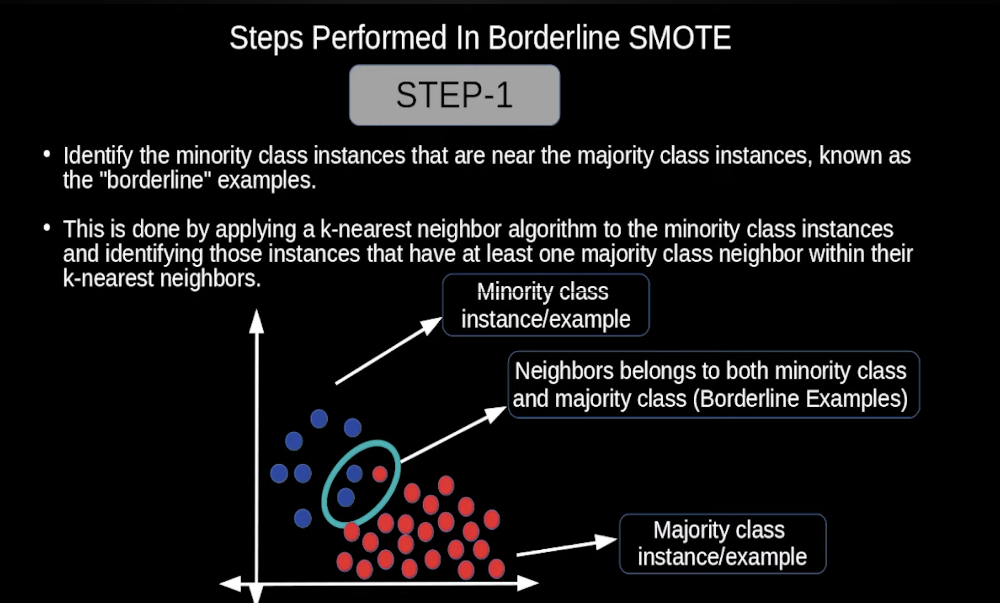

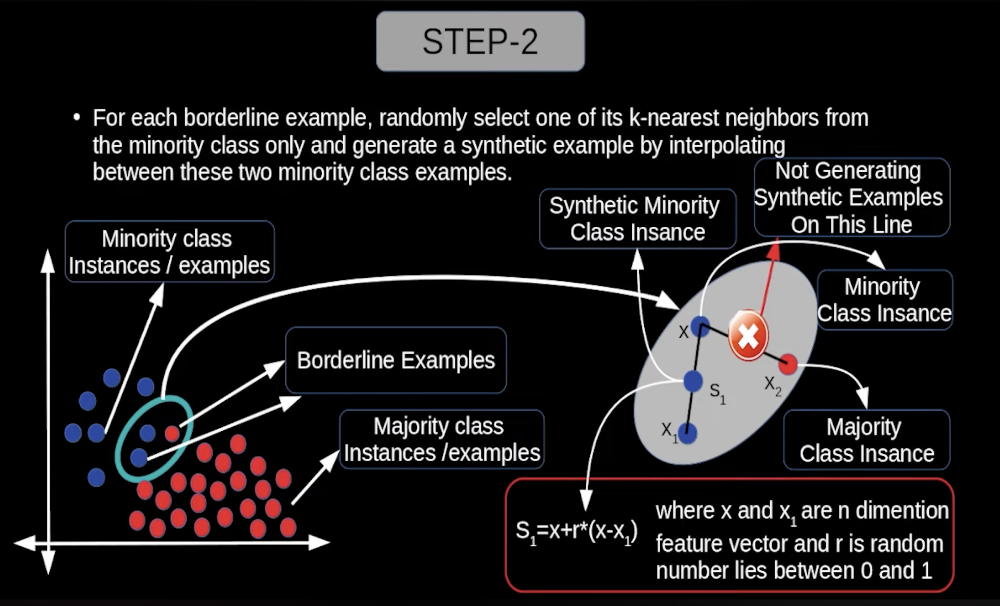

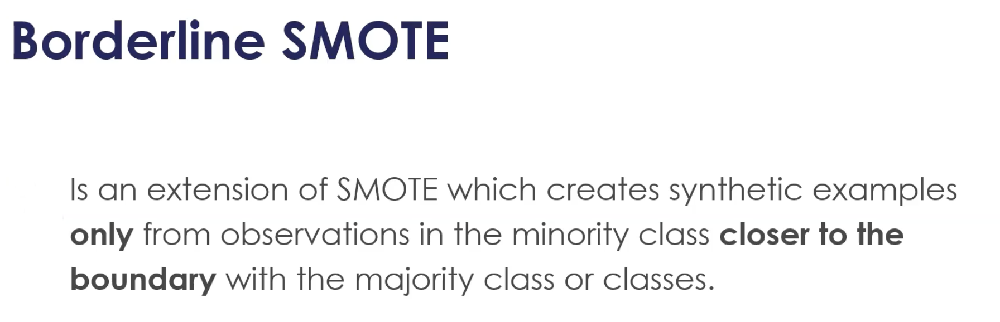

Observations that are closer to the boundary are the hardest to classify

an advanced variation of the Synthetic Minority Over-sampling Technique (SMOTE) designed to handle imbalanced datasets. While standard SMOTE generates synthetic points randomly across all minority examples, Borderline-SMOTE only creates new data points near the decision boundary (the "borderline") between minority and majority classes.

The algorithm uses K-nearest neighbors (KNN) to classify each minority instance. Points that have a mix of both majority and minority class neighbors are categorized as "danger" or "border" points. Minority points surrounded entirely by majority points are treated as noise.

In [57]:
from imblearn.over_sampling import BorderlineSMOTE
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier


## Initalize BorderLineSMOTE
borderlinesmote=BorderlineSMOTE()

## PERFORM SMOTE
X_blsmote,y_blsmote=borderlinesmote.fit_resample(X_train,y_train)

y_blsmote.value_counts()


Class
0    15983
1    15983
Name: count, dtype: int64

In [58]:
## Initalize the model
rf_model_blsmote=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_blsmote.fit(X_blsmote,y_blsmote)

## predict on test set 

y_pred_blsmote=rf_model_blsmote.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_blsmote)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_blsmote)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_blsmote)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   4    4]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.50      0.67         8

    accuracy                           1.00      4000
   macro avg       1.00      0.75      0.83      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.95475


Best For

Difficult classification problems.

## SVMSMOTE

SVMSMOTE (Support Vector Machine Synthetic Minority Over-sampling Technique) is an advanced oversampling method designed for heavily imbalanced datasets. It trains an SVM to identify the complex decision boundary between classes, then focuses only on "support vectors" (borderline instances) to synthesize new minority data points.Traditional SMOTE can cause overlapping and blurred decision boundaries by generating synthetic samples indiscriminately. SVMSMOTE solves this by:Training an SVM to isolate the boundary area.Identifying the Support Vectors located directly along this margin.Generating synthetic samples only along the line segments connecting these boundary support vectors to their nearest neighbors.Using interpolation (if neighbors are primarily minority class) or extrapolation (if neighbors are primarily majority class) to shape the new data.

Uses support vectors to generate new samples.

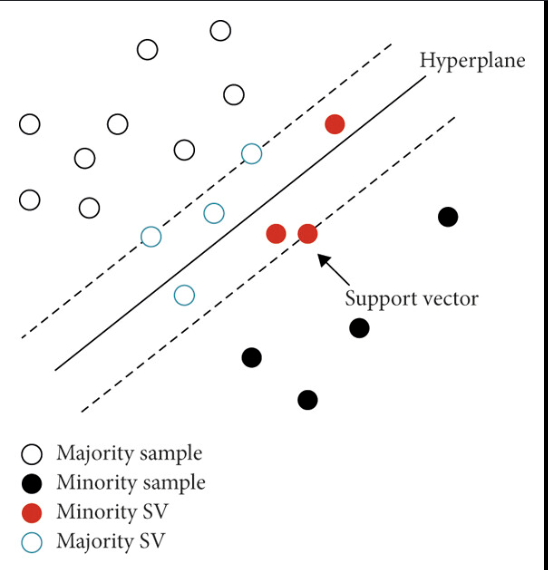

In [59]:
from imblearn.over_sampling import SVMSMOTE
smote = SVMSMOTE( random_state=42 )
X_svsmote, y_svsmote = smote.fit_resample( X_train, y_train )

## Initalize the model
rf_model_svsmote=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_svsmote.fit(X_svsmote,y_svsmote)

## predict on test set 

y_pred_svsmote=rf_model_svsmote.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_svsmote)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_svsmote)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_svsmote)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   4    4]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.50      0.67         8

    accuracy                           1.00      4000
   macro avg       1.00      0.75      0.83      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.95475


## ADASYN (Adaptive Synthetic Sampling)

Generates more samples where learning is difficult.

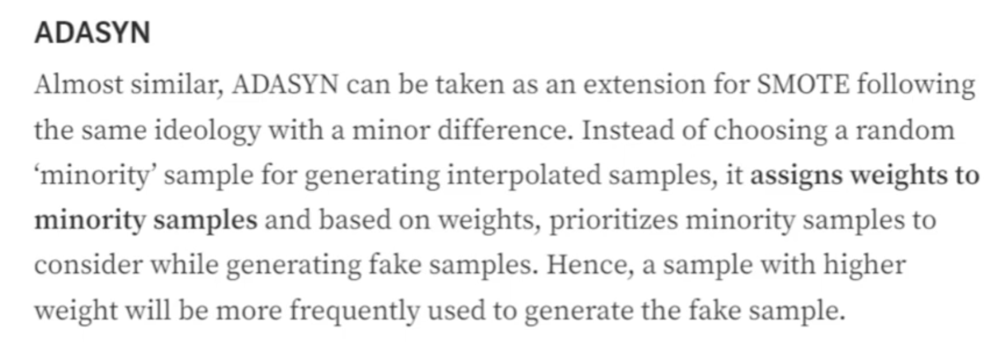

How It Works

Density-based: ADASYN calculates the local density of minority class examples using the K-Nearest Neighbors (KNN) algorithm.

Weighted Distribution: It assigns higher weights to minority samples that are surrounded by more majority class instances, meaning it synthesizes more data points in complex, overlapping regions.

Boundary Shifting: This adaptive approach forces the classification model's decision boundary to shift toward the difficult-to-classify examples, thereby improving generalization

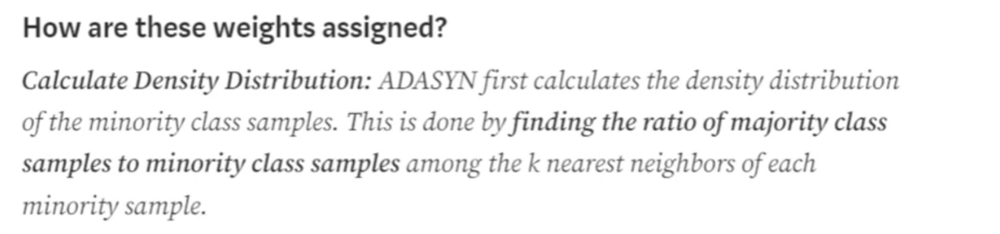

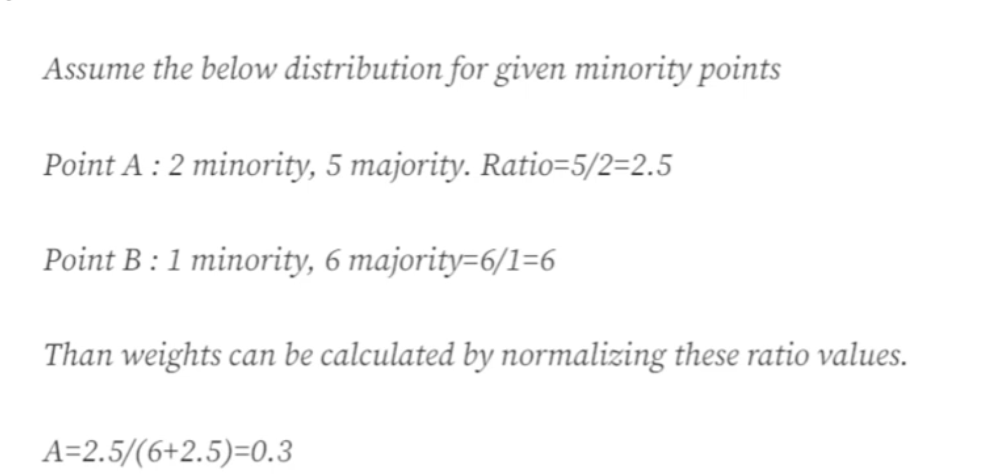

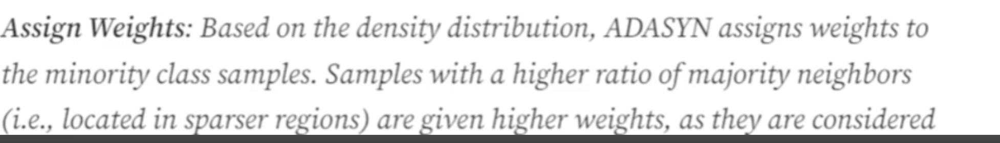 difficult to classify

In [61]:
from imblearn.over_sampling import ADASYN
adasyn = ADASYN( random_state=42 ) 
X_ada, y_ada = adasyn.fit_resample( X_train, y_train )
## Initalize the model
rf_model_ada=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_ada.fit(X_ada,y_ada)

## predict on test set 

y_pred_ada=rf_model_ada.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_ada)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_ada)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_ada)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   7    1]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.12      0.22         8

    accuracy                           1.00      4000
   macro avg       1.00      0.56      0.61      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.954


Difference from SMOTE

SMOTE:

Creates equal synthetic samples everywhere.

ADASYN:

Creates more synthetic samples in difficult regions.

## SMOTE+Tomek Links

SMOTETomek is a hybrid data resampling technique in machine learning that handles imbalanced datasets by combining oversampling and undersampling. It expands the minority class while cleaning up ambiguous, overlapping data points between majority classes.The process operates in two steps:
SMOTE (Synthetic Minority Over-sampling Technique): Adds new, synthetic instances of the minority class using linear interpolation between existing minority points to balance the dataset.

Tomek Links: Scans the dataset for pairs of data points from opposite classes that are each other's closest neighbors. Removing these "links" eliminates overlapping, ambiguous data at the decision boundary, making the classes distinct.

In [63]:
from imblearn.combine import SMOTETomek
smote_tomek = SMOTETomek( random_state=42 ) 
X_st, y_st = smote_tomek.fit_resample( X_train, y_train )


rf_model_st=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_st.fit(X_st,y_st)

## predict on test set 

y_pred_st=rf_model_st.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_st)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_st)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_st)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   7    1]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.12      0.22         8

    accuracy                           1.00      4000
   macro avg       1.00      0.56      0.61      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.954


## Tomek Links

Removes noisy majority samples near boundaries.

In [64]:
from imblearn.under_sampling import TomekLinks
tomek_link=TomekLinks()
X_tl,y_tl=tomek_link.fit_resample(X_train,y_train)


rf_model_tl=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_tl.fit(X_tl,y_tl)

## predict on test set 

y_pred_tl=rf_model_st.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_tl)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_tl)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_tl)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   7    1]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.12      0.22         8

    accuracy                           1.00      4000
   macro avg       1.00      0.56      0.61      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.954


## NearMiss

Smart undersampling method.

Keeps majority samples closest to minority samples.

In [65]:
from imblearn.under_sampling import NearMiss
nm=NearMiss()
X_nm,y_nm=nm.fit_resample(X_train,y_train)

rf_model_nm=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_tl.fit(X_nm,y_nm)

## predict on test set 

y_pred_nm=rf_model_st.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_nm)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_nm)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_nm)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   7    1]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.12      0.22         8

    accuracy                           1.00      4000
   macro avg       1.00      0.56      0.61      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.954


Why apply SMOTE only on training data?

Because synthetic samples generated from test data leak information into training.

## SMOTE + ENN

SMOTEENN integrates SMOTE with the Edited Nearest Neighbors (ENN) algorithm to enhance classifier performance on imbalanced data [11]. SMOTE generates synthetic minority class examples by interpolating between existing minority instances and their nearest neighbors, increasing the minority class population without duplicating samples. ENN then refines the dataset by removing noisy and ambiguous instances from both the majority and minority classes, particularly those misclassified by their k-nearest neighbors. This sequential process not only balances the class distribution but also improves data quality by reducing noise, leading to better classification performance compared to using SMOTE or ENN alone

In [66]:
from imblearn.combine import SMOTEENN
sn=SMOTEENN()
X_sn,y_sn=sn.fit_resample(X_train,y_train)

rf_model_sn=RandomForestClassifier()

## train the model on Random_oversampled_data
rf_model_sn.fit(X_sn,y_sn)

## predict on test set 

y_pred_sn=rf_model_st.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred_sn)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred_sn)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred_sn)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   7    1]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.12      0.22         8

    accuracy                           1.00      4000
   macro avg       1.00      0.56      0.61      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.954


## Cost sensitive learning:

you make some changes in the learning process of ML Algo so that your ml algo is able to handle imbalanced data better

Techniques:

1-Class weighting

2-Custom Loss functions

## Class Weighting

Instead of changing the data, change the learning process.

Minority class receives larger penalties.

1-100 points.

0-900 points. 

weight of 1 = 1000/2*100 =5

weight of 0 = 1000/2*900=1000/1800= 0.6

Take errors of 1 seriously

class_weights is present in : SVM, RandomForest, DecisionTrees etc

class_weights parameter not present in: Naive Bayes, KNN

In [71]:
# Formula:

# weight = total_samples / (n_classes * class_count)

## class_weight={1:5, 0:1} means class 1 is given weight 5 and class 0 is given weight 1

In [72]:
y_train.value_counts()

Class
0    15983
1       17
Name: count, dtype: int64

In [74]:
from sklearn.ensemble import RandomForestClassifier

model=RandomForestClassifier(random_state=42,class_weight={0:1,1:25})

model.fit(X_train, y_train)
y_pred=model.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3992    0]
 [   4    4]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3992
           1       1.00      0.50      0.67         8

    accuracy                           1.00      4000
   macro avg       1.00      0.75      0.83      4000
weighted avg       1.00      1.00      1.00      4000

Accuracy (SMOTE): 0.95475


In [75]:
from sklearn.linear_model import LogisticRegression 
model = LogisticRegression( class_weight='balanced' ) 
model.fit(X_train, y_train)
y_pred=model.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3815  177]
 [   2    6]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      0.96      0.98      3992
           1       0.03      0.75      0.06         8

    accuracy                           0.96      4000
   macro avg       0.52      0.85      0.52      4000
weighted avg       1.00      0.96      0.98      4000

Accuracy (SMOTE): 0.941


/Users/priyanshugupta/Desktop/scikit learn/.venv/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


## Supported Algorithms:

1-Logistic Regression

2-SVM

3-Decision Tree

4-Random Forest

5-Extra Trees

## Custom Loss Functions passed to model

spse we want false positive is very critical

## Ensemble Methods 

## Balanced Random Forest

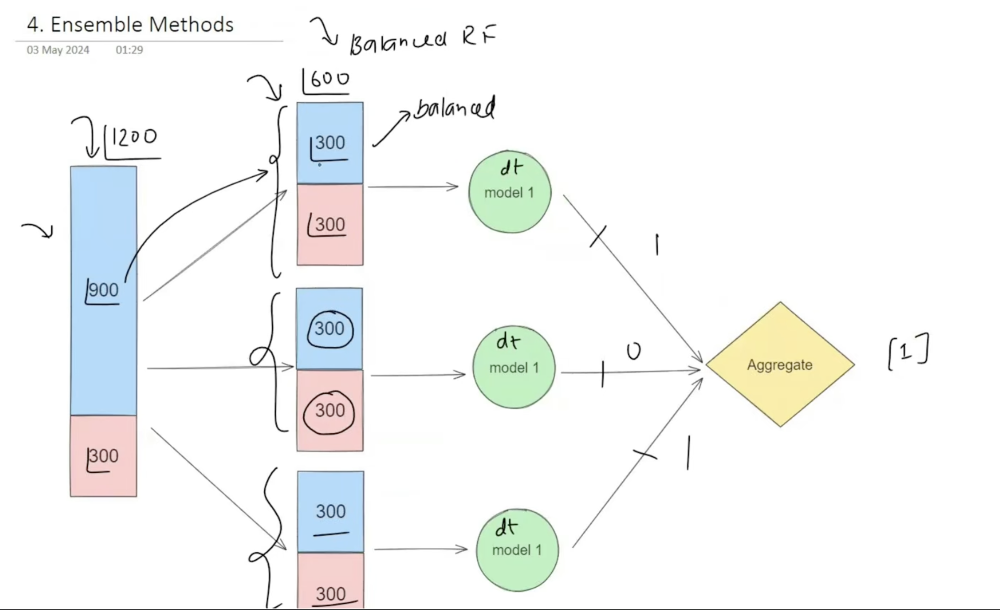

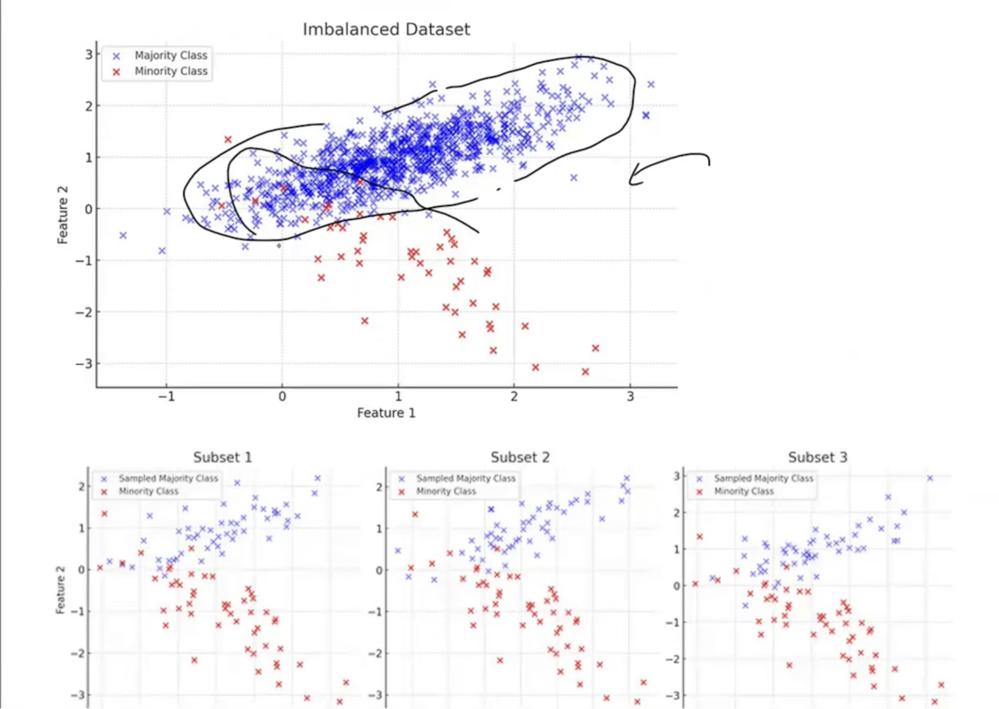

When you are creating a new data set by sampling, you achieve balance here 

In [67]:
from imblearn.ensemble import BalancedRandomForestClassifier

model=BalancedRandomForestClassifier(
    random_state=42
)

model.fit(X_train, y_train)


y_pred=model.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred)
print('Accuracy (SMOTE):',accuracy_smote)


confusion matrix(SMOTE):
[[3970   22]
 [   1    7]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      3992
           1       0.24      0.88      0.38         8

    accuracy                           0.99      4000
   macro avg       0.62      0.93      0.69      4000
weighted avg       1.00      0.99      1.00      4000

Accuracy (SMOTE): 0.9605


## Easy Ensemble

The Easy Ensemble Classifier (EEC) is an advanced ensemble learning algorithm specifically designed to address class imbalance issues in classification tasks. It enhances the performance of models on imbalanced datasets by leveraging oversampling and ensembling techniques to improve classification accuracy for the minority class, which is often critical in applications such as fraud detection and medical diagnosis

Class imbalance is a common challenge in machine learning, where traditional algorithms may exhibit a bias towards the majority class, leading to suboptimal performance on the minority class. EEC tackles this issue through the following strategies:

Balancing Training Data: EEC creates balanced subsets by under-sampling the majority class, ensuring that each subset has an almost equal representation of both classes.

Ensembling for Robustness: By combining predictions from classifiers trained on these balanced subsets, EEC improves generalization, robustness, and reduces model bias towards the majority class.

Boosting Technique: EEC often incorporates boosting methods like AdaBoost, focusing on misclassified instances to enhance the handling of class imbalance.

In [68]:
from imblearn.ensemble import EasyEnsembleClassifier

model = EasyEnsembleClassifier( random_state=42 )
model.fit(X_train, y_train)
y_pred=model.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3775  217]
 [   1    7]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      3992
           1       0.03      0.88      0.06         8

    accuracy                           0.95      4000
   macro avg       0.52      0.91      0.52      4000
weighted avg       1.00      0.95      0.97      4000

Accuracy (SMOTE): 0.95475


## RUSBoost 

RUSBoost is a machine learning algorithm designed to handle highly imbalanced datasets. It combines boosting (typically AdaBoost) with Random Under-Sampling (RUS). At each boosting iteration, it undersamples the majority class to balance the data, trains a weak learner (usually a decision tree), and updates sample weights

In [70]:
from imblearn.ensemble import RUSBoostClassifier

model =RUSBoostClassifier( random_state=42 )
model.fit(X_train, y_train)
y_pred=model.predict(X_test)

## confusion matrix

conf_matrix_smote=confusion_matrix(y_test,y_pred)
print('confusion matrix(SMOTE):')
print(conf_matrix_smote)

## classification report

class_report_smote=classification_report(y_test,y_pred)
print('classification report (SMOTE):')
print(class_report_smote)

## cal accuracy

accuracy_smote=rf_model_rus.score(X_test,y_pred)
print('Accuracy (SMOTE):',accuracy_smote)

confusion matrix(SMOTE):
[[3798  194]
 [   2    6]]
classification report (SMOTE):
              precision    recall  f1-score   support

           0       1.00      0.95      0.97      3992
           1       0.03      0.75      0.06         8

    accuracy                           0.95      4000
   macro avg       0.51      0.85      0.52      4000
weighted avg       1.00      0.95      0.97      4000

Accuracy (SMOTE): 0.92875
